In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# 랜덤 시드 고정
torch.manual_seed(777)

# GPU 사용 가능일 경우 랜덤 시드 고정
if device == 'cuda':
    torch.cuda.manual_seed_all(777)

# Skeleton 좌표 데이터 가져오기


In [ ]:
file_path = '/content/gdrive/MyDrive/DataSet/Skeleton/Tpose/TPose_Skeleton_Sample.json'

df = pd.read_json(file_path)
df

,Joint,X,Y,Z
0,2024-02-05 18:23:27,0,0.07659,0.118483
1,1,0.077203,0.177012,2.61938
2,2,0.059431,0.505186,2.60345
3,3,0.077623,0.73841,2.5958
4,4,-0.148304,0.388663,2.63664
...,...,...,...,...
9676,16,0.15173,-0.0591,2.53126
9677,17,0.165674,-0.499014,2.61527
9678,18,0.14639,-0.837407,2.63807
9679,19,0.169291,-0.90852,2.5874


# 마지막 행이 비어있으므로 제외


In [ ]:
df.drop(columns=["Joint"], inplace=True)
df = df[:][:9680]
df

,X,Y,Z
0,0,0.07659,0.118483
1,0.077203,0.177012,2.61938
2,0.059431,0.505186,2.60345
3,0.077623,0.73841,2.5958
4,-0.148304,0.388663,2.63664
...,...,...,...
9675,0.03522,-0.917923,2.57471
9676,0.15173,-0.0591,2.53126
9677,0.165674,-0.499014,2.61527
9678,0.14639,-0.837407,2.63807


# 시간당 좌표 데이터를 나눔

In [ ]:
num_splits = len(df) // 20
dfs_3d = []

for i in range(num_splits):
    # 각각의 작은 DataFrame 생성
    df_split = df.iloc[i*20:(i+1)*20]

    # 작은 DataFrame을 3차원 데이터로 변환하여 리스트에 추가
    dfs_3d.append(df_split.values.reshape(20, 3, 1))

# 리스트를 NumPy 배열로 변환
data_3d = np.array(dfs_3d)

Y_data = torch.tensor(data_3d.astype(float).squeeze())

print(Y_data.shape)  # 출력: (484, 20, 3, 1)

torch.Size([484, 20, 3])


In [ ]:
Y_data = Y_data[:305]
Y_data.shape

torch.Size([305, 20, 3])

# 하나의 시간이 20줄

In [ ]:
# 이게 하나의 시간
df1 = df.loc[:19]
df1

,X,Y,Z
0,0,0.07659,0.118483
1,0.077203,0.177012,2.61938
2,0.059431,0.505186,2.60345
3,0.077623,0.73841,2.5958
4,-0.148304,0.388663,2.63664
5,-0.414836,0.36432,2.64225
6,-0.618957,0.430349,2.59738
7,-0.654641,0.43382,2.60801
8,0.287121,0.407842,2.60764
9,0.523016,0.386305,2.62494


# 시간의 개수

In [ ]:
len(df) / 20

484.0

# Skeleton 좌표를 3차원 그래프로 표현

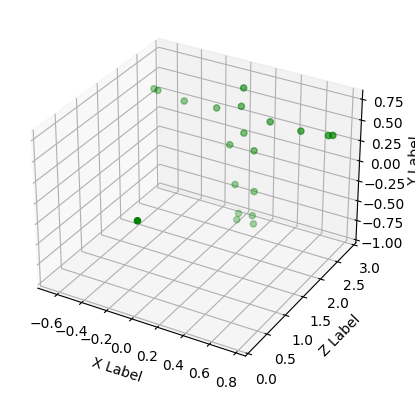

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 데이터프레임의 각 열을 x, y, z 좌표로 사용하여 산점도 그리기
ax.scatter(df1['X'], df1['Z'], df1['Y'], c='g')

# 축 레이블 추가
ax.set_xlabel('X Label')
ax.set_ylabel('Z Label')
ax.set_zlabel('Y Label')

plt.ylim(0,3)
plt.show()

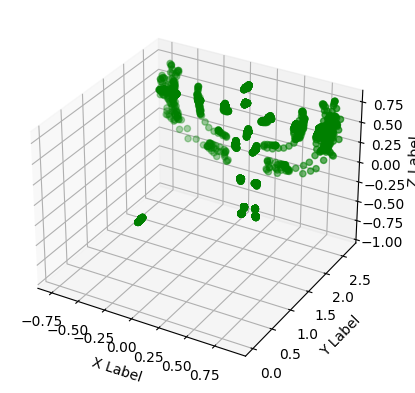

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
X = []
Y = []
Z = []
# 3차원 그래프 생성
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 데이터를 플로팅
for i in range(len(data_3d)):
  for j in range(20):
    X.append(data_3d[i][j][0])
    Y.append(data_3d[i][j][1])
    Z.append(data_3d[i][j][2])
ax.scatter(X, Z, Y, c='g')

# 그래프 설정
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

# 그래프 초기화

In [ ]:
plt.clf()

<Figure size 640x480 with 0 Axes>

# PointCloud 좌표 데이터 가져오기

In [ ]:
file_path = '/content/gdrive/MyDrive/DataSet/PointCloud/Tpose/TPose_pointCloud_Sample.json'

df_pc = pd.read_json(file_path, lines=True)
df_pc

,FILE TYPE,FORMAT VERSION,T,C,V,P,TID,TRK
0,RETINA POINT CLOUD RECORDING,2.0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,1.707125e+09,"[-0.08440309, 2.25276685, -1.38900232, -0.0422...","[0.14484376000000002, 0.14484376000000002, 0.1...","[2178.0, 2281.0, 2255.0, 2078.0, 2058.0, 2340....","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 2, 0.0836897, 2.35948348]"
2,NaN,NaN,1.707125e+09,"[-0.7299726, 2.32855964, -1.49647498, -0.68434...","[-0.43453127, -0.43453127, -0.43453127, -0.434...","[9268.0, 8977.0, 9616.0, 11462.0, 12556.0, 125...","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 2, 0.01068179, 2.36921167]"
3,NaN,NaN,1.707125e+09,"[-0.82121921, 2.4212873, -1.28742135, -0.77559...","[-0.36210939000000003, -0.36210939000000003, -...","[5633.0, 6609.0, 7383.0, 7609.0, 6941.0, 5882....","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 2, -0.31667721, 2.38457322]"
4,NaN,NaN,1.707125e+09,"[0.54747945, 2.5019629, -1.27864575, 0.5931027...","[-0.28968751, -0.28968751, -0.28968751, -0.289...","[10144.0, 10427.0, 10666.0, 10913.0, 11236.0, ...","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 2, -0.28106833000000003, 2.37718058]"
...,...,...,...,...,...,...,...,...
301,NaN,NaN,1.707125e+09,"[-0.17793083, 2.27210474, -1.6111378699999999,...","[0.14484376000000002, 0.14484376000000002, 0.1...","[4574.0, 4947.0, 4708.0, 4406.0, 5347.0, 5825....","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 6, -0.00911871, 2.45039272]"
302,NaN,NaN,1.707125e+09,"[0.0, 2.21877027, -1.57244503, 0.04334212, 2.2...","[0.14484376000000002, 0.14484376000000002, 0.1...","[18763.0, 19608.0, 22754.0, 26832.0, 28542.0, ...","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 6, 0.048171780000000004, 2.4490428]"
303,NaN,NaN,1.707125e+09,"[-0.08896542, 2.22273707, -1.6856482000000002,...","[0.14484376000000002, 0.14484376000000002, 0.1...","[3244.0, 3370.0, 3089.0, 2891.0, 3763.0, 4357....","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 6, 0.08538171, 2.44017029]"
304,NaN,NaN,1.707125e+09,"[-0.04334212, 2.24341869, -1.5364629, 0.0, 2.2...","[0.14484376000000002, 0.14484376000000002, 0.1...","[19618.0, 22340.0, 22719.0, 20297.0, 21914.0, ...","[255, 255, 255, 255, 255, 255, 255, 255, 255, ...","[1, 6, 0.11040618, 2.44068694]"


# 나는 C만 필요하므로 C만 가져옴

# 첫번째 줄이 좌표 데이터가 아니므로 제외

In [ ]:
# 전체 타임의 길이
df_pc = df_pc["C"]
df_pc = df_pc[1:]
df_pc

1      [-0.08440309, 2.25276685, -1.38900232, -0.0422...
2      [-0.7299726, 2.32855964, -1.49647498, -0.68434...
3      [-0.82121921, 2.4212873, -1.28742135, -0.77559...
4      [0.54747945, 2.5019629, -1.27864575, 0.5931027...
5      [-2.01654935, 2.22981071, -2.19320726, -1.9572...
                             ...                        
301    [-0.17793083, 2.27210474, -1.6111378699999999,...
302    [0.0, 2.21877027, -1.57244503, 0.04334212, 2.2...
303    [-0.08896542, 2.22273707, -1.6856482000000002,...
304    [-0.04334212, 2.24341869, -1.5364629, 0.0, 2.2...
305    [-0.13344812, 2.2999351, -1.57555568, -0.08896...
Name: C, Length: 305, dtype: object

In [ ]:
df_r = df_pc.loc[1]
df_r

[-0.08440309,
 2.25276685,
 -1.38900232,
 -0.042201550000000004,
 2.25365973,
 -1.38947701,
 0.0,
 2.25395727,
 -1.38963521,
 0.042201550000000004,
 2.25365973,
 -1.38947701,
 -0.12660463,
 2.27317429,
 -1.35205698,
 -0.08440309,
 2.27466202,
 -1.35284793,
 -0.042201550000000004,
 2.27555418,
 -1.35332239,
 0.0,
 2.27585149,
 -1.35348046,
 0.042201550000000004,
 2.27555418,
 -1.35332239,
 -0.12660463,
 2.29447436,
 -1.31558609,
 -0.08440309,
 2.29596114,
 -1.31637657,
 -0.042201550000000004,
 2.29685259,
 -1.31685066,
 0.0,
 2.2971499,
 -1.31700873,
 0.042201550000000004,
 2.29685259,
 -1.31685066,
 0.08440309,
 2.29596114,
 -1.31637657,
 -0.16880618,
 2.313097,
 -1.27769172,
 -0.12660463,
 2.31517911,
 -1.27879882,
 -0.08440309,
 2.31666517,
 -1.27958894,
 -0.042201550000000004,
 2.31755638,
 -1.2800627900000001,
 0.0,
 2.31785345,
 -1.28022075,
 0.042201550000000004,
 2.31755638,
 -1.2800627900000001,
 0.08440309,
 2.31666517,
 -1.27958894,
 -0.12660463,
 2.33528876,
 -1.24169517,
 -

In [ ]:
df_pc.shape

(305,)

# 첫번째 시간의 좌표 데이터

# 시간마다 좌표 데이터 길이

In [ ]:
# 하나의 타임마다 데이터 길이
for i in range(1, len(df_pc)):
  print(len(df_pc[i]))

1893
1467
813
1809
858
945
1503
1773
1731
972
1965
1869
1206
1191
1497
1185
1179
1641
864
342
1173
2040
2286
1536
567
492
918
336
735
615
1212
516
525
549
540
249
0
0
210
375
417
0
192
366
3
0
0
798
393
198
261
852
222
174
336
807
543
552
432
825
732
702
804
678
723
678
0
276
735
993
666
117
210
894
234
348
1170
1311
873
372
555
1152
846
174
558
591
1185
390
465
618
285
228
0
144
0
381
0
0
0
279
0
0
312
963
873
252
189
933
279
126
405
573
870
156
168
543
630
156
201
336
501
387
0
282
366
1062
654
450
591
684
0
147
186
864
162
141
354
720
1089
756
942
870
738
612
150
492
873
408
414
468
354
198
177
210
192
804
474
537
438
882
603
588
552
1209
912
447
438
747
723
735
705
1035
804
396
834
741
795
318
213
216
228
492
168
0
0
717
471
108
429
894
732
684
753
1089
1050
387
390
696
975
612
861
459
1215
561
738
537
819
1140
1053
957
702
987
1011
912
1002
1074
903
876
1197
1068
1242
816
1746
930
1251
417
1134
1329
1311
963
924
693
933
579
1002
726
828
678
1326
1149
1746
1035
660
531
546
1035
840

# 패딩 크기를 정하기 위해 시각화

최대 길이 : 3930
평균 길이 : 767.1147540983607


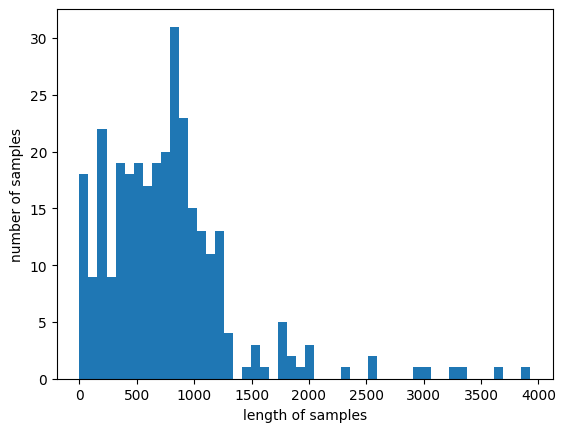

In [ ]:
print('최대 길이 :',max(len(review) for review in df_pc))
print('평균 길이 :',sum(map(len, df_pc))/len(df_pc))
plt.hist([len(review) for review in df_pc], bins=50)
plt.xlabel('length of samples')
plt.ylabel('number of samples')
plt.show()

# 전체 중에서 기준보다 작은 것들의 비율

In [ ]:
def below_threshold_len(max_len, nested_list):
  count = 0
  for sentence in nested_list:
    if(len(sentence) <= max_len):
        count = count + 1
  print('전체 샘플 중 길이가 %s 이하인 샘플의 비율: %s'%(max_len, (count / len(nested_list))*100))

In [ ]:
max_len = 1500
below_threshold_len(max_len, df_pc)

전체 샘플 중 길이가 1500 이하인 샘플의 비율: 92.45901639344262


# 제로 패딩 함수

최대길이로 패딩

In [ ]:
def pad_sequences(sentences, max_len):
  features = np.zeros((len(sentences), max_len), dtype=float)
  for index, sentence in enumerate(sentences):
    if len(sentence) != 0:
      features[index, :len(sentence)] = np.array(sentence)[:max_len]
  return features

# 패딩 결과 확인

In [ ]:
padded_data = pad_sequences(df_pc, 1500)
len(padded_data[1])

1500

In [ ]:
 # 하나의 타임마다 데이터 길이
for i in range(1, len(df_pc)):
  print(padded_data[i])

[-0.7299726   2.32855964 -1.49647498 ...  0.          0.
  0.        ]
[-0.82121921  2.4212873  -1.28742135 ...  0.          0.
  0.        ]
[ 0.54747945  2.5019629  -1.27864575 ... -0.04220155  2.35718107
 -1.20553935]
[-2.01654935  2.22981071 -2.19320726 ...  0.          0.
  0.        ]
[ 0.6843493   2.49575233 -1.22367203 ...  0.          0.
  0.        ]
[-0.48930979  2.42617249 -1.2900188  ... -0.346737    2.52457666
 -0.94963735]
[ 0.319363    2.51174831 -1.33552039 ...  0.30339488  2.40620184
 -1.23031235]
[-0.5337925   2.39764714 -1.32523143 ... -0.7755959   2.54946542
 -1.04554546]
[ 0.          2.35923457 -1.35260344 ...  0.          0.
  0.        ]
[-0.04448271  2.35177112 -1.50235796 ... -0.7299726   2.44396758
 -1.29948068]
[-0.18249315  2.43155837 -1.49956882 ... -0.59310275  2.38175058
 -1.47308552]
[-0.6079303   2.41630483 -1.54958892 ...  0.          0.
  0.        ]
[ 0.          2.33736086 -1.3900609  ...  0.          0.
  0.        ]
[ 0.          2.18468046 -1.4

# PointCloud 좌표 데이터를 DataFrame으로 가져오기

In [ ]:
X = []
Y = []
Z = []
new = {"X":[], "Y":[], "Z":[]}

for i in range(len(df_r)):
  if i % 3 == 0:
    X.append(df_r[i])
  elif i % 3 == 1:
    Z.append(df_r[i])
  else:
    Y.append(df_r[i])
new["X"] = X
new["Y"] = Y
new["Z"] = Z
pointcloud = pd.DataFrame(new)
pointcloud

,X,Y,Z
0,-0.084403,-1.389002,2.252767
1,-0.042202,-1.389477,2.253660
2,0.000000,-1.389635,2.253957
3,0.042202,-1.389477,2.253660
4,-0.126605,-1.352057,2.273174
...,...,...,...
626,-0.182493,-1.218787,2.583745
627,-0.136870,-1.219985,2.585999
628,-0.091247,-1.220840,2.587607
629,-0.228116,-1.175762,2.600006


# PointCloud 좌표 3차원 그래프로 표현

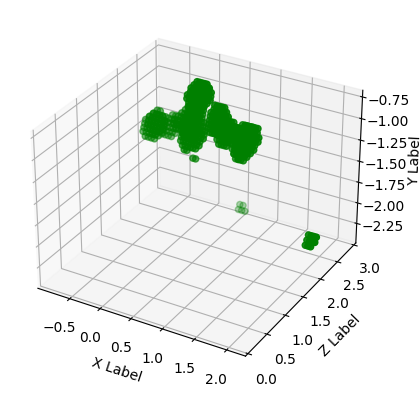

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 데이터프레임의 각 열을 x, y, z 좌표로 사용하여 산점도 그리기
ax.scatter(pointcloud['X'], pointcloud['Z'], pointcloud['Y'], c='g')

# 축 레이블 추가
ax.set_xlabel('X Label')
ax.set_ylabel('Z Label')
ax.set_zlabel('Y Label')

plt.ylim(0,3)
plt.show()

# Point Cloud 데이터 분할

In [ ]:
X = []
Y = []
Z = []
new = {"X":[], "Y":[], "Z":[]}

for i in range(len(padded_data)):
  for j in range(len(padded_data[i])):
    if j % 3 == 0:
      X.append(padded_data[i][j])
    elif j % 3 == 1:
      Z.append(padded_data[i][j])
    else:
      Y.append(padded_data[i][j])
new["X"] = X
new["Y"] = Y
new["Z"] = Z

X_data = pd.DataFrame(new)

# 데이터 차원 조절

In [ ]:
num_splits = len(X_data) // 500
dfs_3dd = []

for i in range(num_splits):
    # 각각의 작은 DataFrame 생성
    df_split = X_data.iloc[i*500:(i+1)*500]

    # 작은 DataFrame을 3차원 데이터로 변환하여 리스트에 추가
    dfs_3dd.append(df_split.values.reshape(500, 3, 1))

# 리스트를 NumPy 배열로 변환
data_3dd = np.array(dfs_3dd)

# PointCloud data
X_data = data_3dd.astype(float).squeeze()
X_data.shape

print(X_data.shape)

(305, 500, 3)


# Skeleton 데이터 정규화

In [ ]:


tensor_data = [torch.tensor(frame) for frame in X_data]

scaler = StandardScaler()
for i in range(len(tensor_data)):
    frame = tensor_data[i].numpy().reshape(-1, 3)
    normalized_frame = scaler.fit_transform(frame)
    tensor_data[i] = torch.tensor(normalized_frame)

X_data = [frame.tolist() for frame in tensor_data]
X_data

[[[-0.417220634670982, -0.3289675283272838, -1.8230519466875383],
  [-0.33802970998572046, -0.33082840489263354, -1.814407550829924],
  [-0.2588387665355217, -0.3314485794752838, -1.811526924605263],
  [-0.1796478230853229, -0.33082840489263354, -1.814407550829924],
  [-0.4964115593562437, -0.184134653388142, -1.62547781600868],
  [-0.417220634670982, -0.1872353302917278, -1.6110743944411114],
  [-0.33802970998572046, -0.18909530521261414, -1.6024369692458682],
  [-0.2588387665355217, -0.18971497017013375, -1.599558569760575],
  [-0.1796478230853229, -0.18909530521261414, -1.6024369692458682],
  [-0.4964115593562437, -0.04116171416795359, -1.419261709841084],
  [-0.417220634670982, -0.04426054858068057, -1.4048674856752545],
  [-0.33802970998572046, -0.04611907303003995, -1.3962369343276282],
  [-0.2588387665355217, -0.046738737987558704, -1.393358534842335],
  [-0.1796478230853229, -0.04611907303003995, -1.3962369343276282],
  [-0.10045689840006129, -0.04426054858068057, -1.4048674856

# Point Cloud 데이터 정규화

In [ ]:
tensor_data = [torch.tensor(frame) for frame in Y_data]

scaler = StandardScaler()
for i in range(len(tensor_data)):
    frame = tensor_data[i].numpy().reshape(-1, 3)
    normalized_frame = scaler.fit_transform(frame)
    tensor_data[i] = torch.tensor(normalized_frame)

Y_data = [frame.tolist() for frame in tensor_data]
Y_data

<ipython-input-138-22bf71bd4f3a>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_data = [torch.tensor(frame) for frame in Y_data]


[[[-0.20346151329547352, 0.11720218679366333, -4.354543071054239],
  [0.013908362041978978, 0.30342535772703516, 0.25339614944405725],
  [-0.0361298803620914, 0.911991412257636, 0.22404489196222663],
  [0.015090899843560665, 1.344482132125282, 0.20994965531840976],
  [-0.6210212421663521, 0.6959110939750505, 0.2851979513358584],
  [-1.3714597310500842, 0.6507694207607239, 0.2955344582079915],
  [-1.9461759181849736, 0.773213636373786, 0.21286082837687156],
  [-2.046646582260308, 0.7796502607720495, 0.23244675851069813],
  [0.604946667961509, 0.7314766426164492, 0.23176502811093144],
  [1.2691246553522464, 0.691538417417544, 0.2636405305864916],
  [1.8702198821609899, 0.7607576277067922, 0.25341457458999705],
  [1.959262163053896, 0.7855454002022076, 0.26338257854333674],
  [-0.25151618931570036, 0.006616862862218888, 0.13853378965640387],
  [-0.163831011328419, -0.9369090113373564, 0.2306042439167345],
  [-0.08876154078767817, -1.618562555758121, 0.2623139200788385],
  [-0.084280567189

# train set과 test set 구분
# pytorch가 원하는 구조로 데이터 구조 변경

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_data, Y_data, test_size= 0.2, random_state=1234)

X_train = np.transpose(X_train, (2, 1, 0))
X_test = np.transpose(X_test, (2, 1, 0))
y_train = np.transpose(y_train, (2, 1, 0))
y_test = np.transpose(y_test, (2, 1, 0))

# tensor로 변환

In [ ]:
tensor_X_train = torch.tensor(X_train).float()
tensor_X_test = torch.tensor(X_test).float()
tensor_y_train = torch.tensor(y_train).float()
tensor_y_test = torch.tensor(y_test).float()

print(
    tensor_X_train.shape,
tensor_X_test.shape,
tensor_y_train.shape,
tensor_y_test.shape,
)

torch.Size([3, 500, 244]) torch.Size([3, 500, 61]) torch.Size([3, 20, 244]) torch.Size([3, 20, 61])


# 데이터셋, 데이터로더 설정

In [ ]:
train_dataset = TensorDataset(tensor_X_train, tensor_y_train)
test_dataset = TensorDataset(tensor_X_test, tensor_y_test)

train_loader = DataLoader(dataset=train_dataset, batch_size=3, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=3, shuffle=False)

learning_rate = 0.001
training_epochs = 10

# CNN 모델 정의

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        # 3*500*244 -> 32*250*122
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2))
        # 32*250*122 -> 64*125*61
        self.layer2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2))
        # 64*125*61 -> 3*62*30
        self.layer3 = nn.Sequential(
            nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2))

        self.fc1 = nn.Linear(3*62*30, 60)

    def forward(self, x):
        print(x.shape)
        out = self.layer1(x)
        print(out.shape)
        out = self.layer2(out)
        print(out.shape)
        out = self.layer3(out)
        print(out.shape)
        out = out.view(out.size(0), -1)
        print(out.shape)
        out = self.fc1(out)
        return out

# 모델 학습 진행

In [ ]:
def point_cloud_to_image(point_cloud, grid_size=(64, 64)):
    x = point_cloud[:, 0]
    y = point_cloud[:, 1]
    z = point_cloud[:, 2]

    # Normalize coordinates to fit within the grid
    x = ((x - x.min()) / (x.max() - x.min()) * (grid_size[0] - 1)).astype(np.int32)
    y = ((y - y.min()) / (y.max() - y.min()) * (grid_size[1] - 1)).astype(np.int32)

    # Create a 2D grid image, using z-values as pixel values
    image = np.zeros(grid_size)
    image[x, y] = z

    return image

In [ ]:
image_tensor = torch.tensor(image, dtype=torch.float32).unsqueeze(0).unsqueeze(0)  # (1, 1, H, W)
print("Image tensor shape:", image_tensor.shape)

Image tensor shape: torch.Size([1, 1, 64, 64])


In [ ]:
# 모델 생성
model = CNN().to(device)

criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

for epoch in range(training_epochs):
    running_loss = 0.0
    for X, Y in train_loader:
        X_train = X.to(device)
        Y_train = Y.to(device)
        optimizer.zero_grad()
        hypothesis = model(X_train)
        loss = criterion(hypothesis, Y_train.view(Y_train.size(0), -1))
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f'Epoch [{epoch + 1}/{training_epochs}], Loss: {running_loss / len(train_loader):.4f}')

print('Finished Training')

torch.Size([3, 500, 244])
torch.Size([32, 250, 122])
torch.Size([64, 125, 61])
torch.Size([3, 62, 30])
torch.Size([3, 1860])


RuntimeError: mat1 and mat2 shapes cannot be multiplied (3x1860 and 5580x60)

In [ ]:
model.eval()
with torch.no_grad():
  X_test = tensor_X_test.to(device)
  Y_test = tensor_y_test.to(device)
  test_outputs = model(X_test)
  test_loss = criterion(test_outputs, Y_test.reshape(Y_test.size(0), -1))
  print(f'Test Loss: {test_loss.item():.4f}')

In [ ]:
test_outputs

In [ ]:
dd = test_outputs.reshape(61, 3, 20)
dd

In [ ]:
X = []
Y = []
Z = []
# 3차원 그래프 생성
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 데이터를 플로팅
for i in range(len(dd)):
  for j in range(20):
    X.append(dd[i][0][j].cpu().numpy())
    Y.append(dd[i][1][j].cpu().numpy())
    Z.append(dd[i][2][j].cpu().numpy())
ax.scatter(X, Z, Y, c='g')

# 그래프 설정
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()